In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [3]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his_88params/')

In [4]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamzs_12chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 12):
        traces[trace].append(np.load('earm_dreamzs_12chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [5]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamzs_12chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 12):
        logps[trace].append(np.load('earm_dreamzs_12chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-7109.89017073]
 [-5200.81013244]
 [-5200.81013244]
 ..., 
 [  150.04096723]
 [  150.04096723]
 [  150.04096723]]
Logp of trace:  a  chain:  1  =  [ 148.06736468]
Logp of trace:  a  chain:  2  =  [ 147.31489542]
Logp of trace:  a  chain:  3  =  [ 145.89120941]
Logp of trace:  a  chain:  4  =  [ 150.16415739]
Logp of trace:  a  chain:  5  =  [ 148.80404292]
Logp of trace:  a  chain:  6  =  [ 147.40498724]
Logp of trace:  a  chain:  7  =  [ 150.13648785]
Logp of trace:  a  chain:  8  =  [ 150.86889288]
Logp of trace:  a  chain:  9  =  [ 152.96063096]
Logp of trace:  a  chain:  10  =  [ 150.73648231]
Logp of trace:  a  chain:  11  =  [ 148.79600918]
Logp of trace:  b  chain: 0 =  [[-4399.25560557]
 [-4257.07576233]
 [-4257.07576233]
 ..., 
 [  150.50975446]
 [  150.50975446]
 [  150.50975446]]
Logp of trace:  b  chain:  1  =  [ 150.3457431]
Logp of trace:  b  chain:  2  =  [ 152.42781988]
Logp of trace:  b  chain:  3  =  [ 149.30647891]
Logp of trace:  b  

In [6]:
traces['a'][0][:,72]

array([-1.27249137, -1.2745663 , -1.2745663 , ...,  2.5260674 ,
        2.5260674 ,  2.5260674 ])

In [7]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [8]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  11  of  88  parameters.
Percent of parameters with GR below 1.2:  12.5
Number of parameters with GR below 1.1:  1  of  88  parameters.
Percent of parameters with GR below 1.1:  1.13636363636


[11, 12.5, 1, 1.1363636363636365]

In [9]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  19  of  88  parameters.
Percent of parameters with GR below 1.2:  21.5909090909
Number of parameters with GR below 1.1:  2  of  88  parameters.
Percent of parameters with GR below 1.1:  2.27272727273


[19, 21.59090909090909, 2, 2.272727272727273]

In [10]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  13  of  88  parameters.
Percent of parameters with GR below 1.2:  14.7727272727
Number of parameters with GR below 1.1:  0  of  88  parameters.
Percent of parameters with GR below 1.1:  0.0


[13, 14.772727272727273, 0, 0.0]

In [11]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  39  of  88  parameters.
Percent of parameters with GR below 1.2:  44.3181818182
Number of parameters with GR below 1.1:  3  of  88  parameters.
Percent of parameters with GR below 1.1:  3.40909090909


[39, 44.31818181818182, 3, 3.4090909090909087]

50000
12
50000


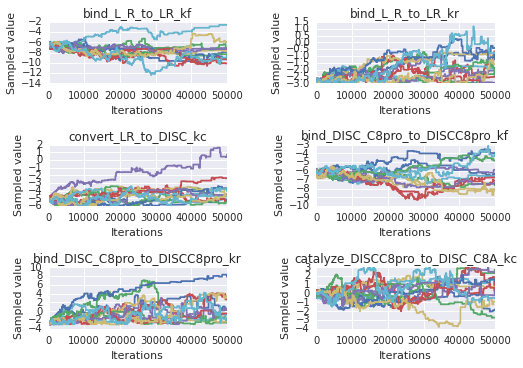

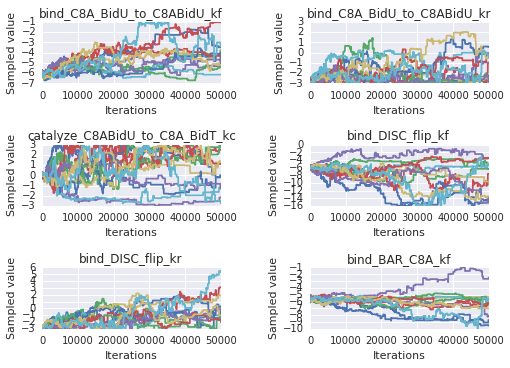

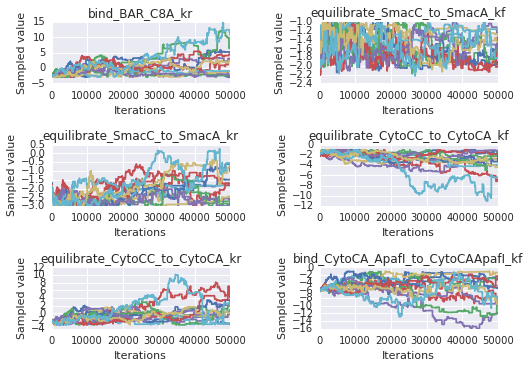

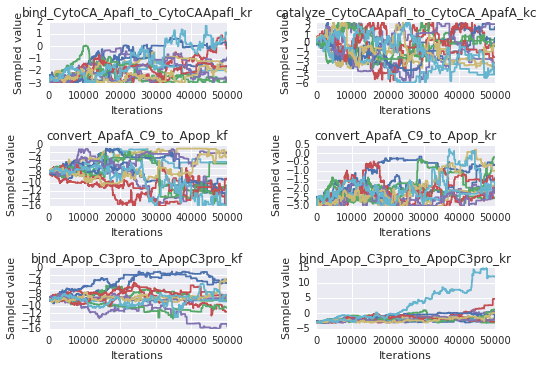

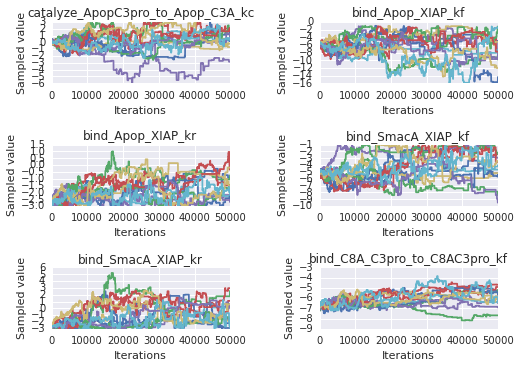

...

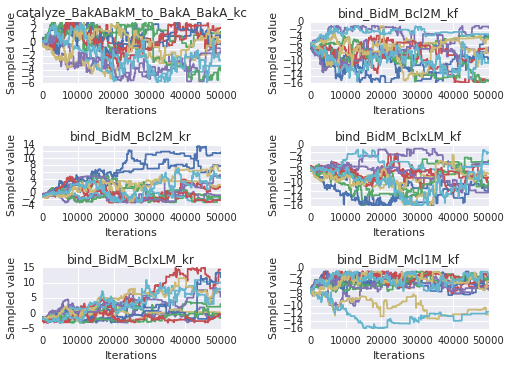

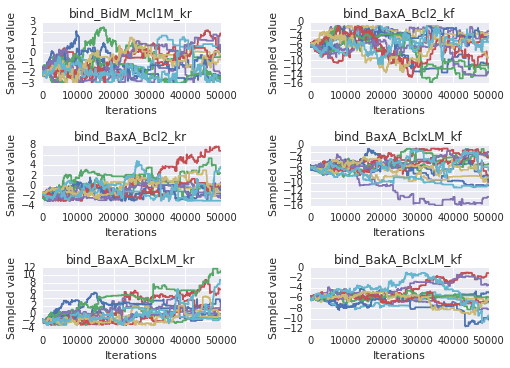

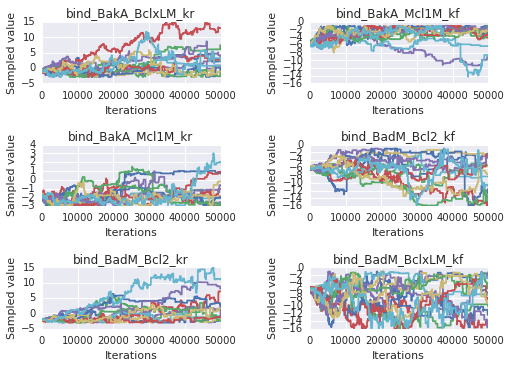

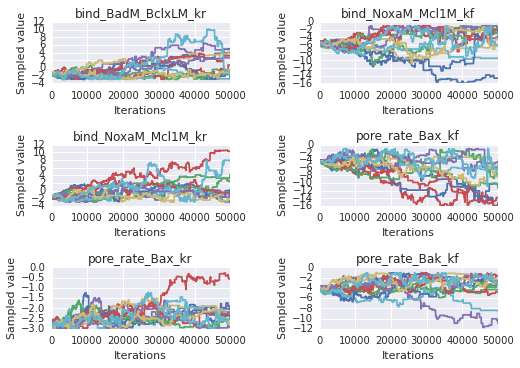

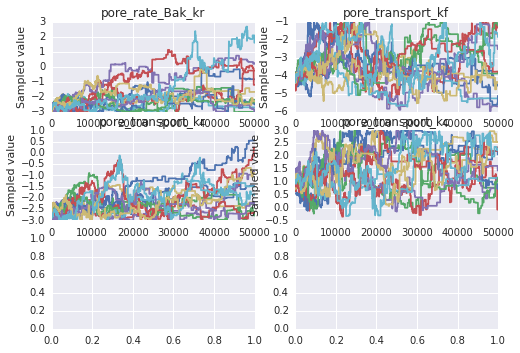

In [12]:
sample_plots(param_trace_dicts['a'])

In [13]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=40000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=40000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=40000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=40000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


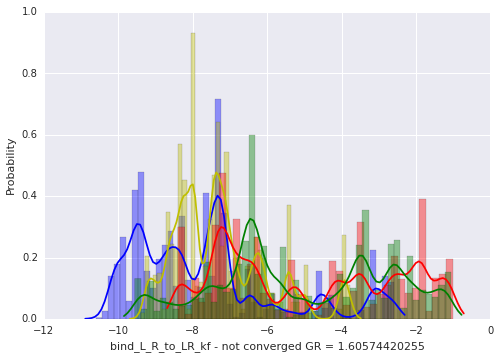

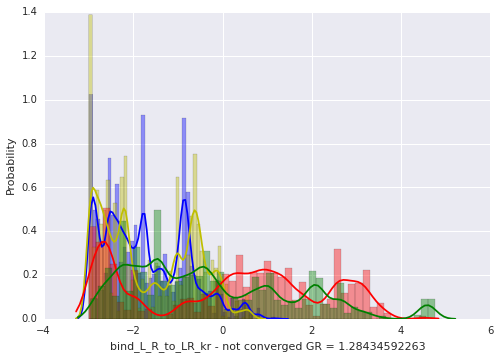

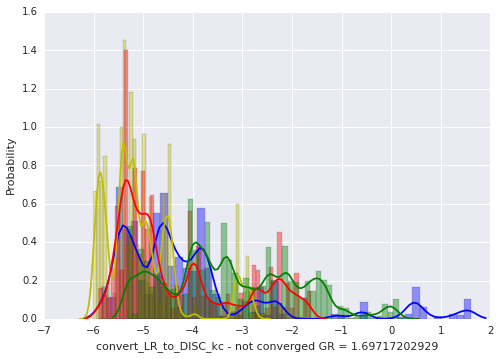

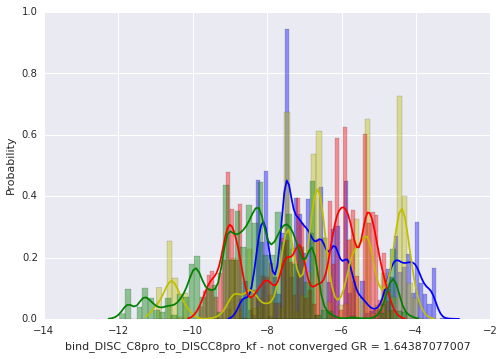

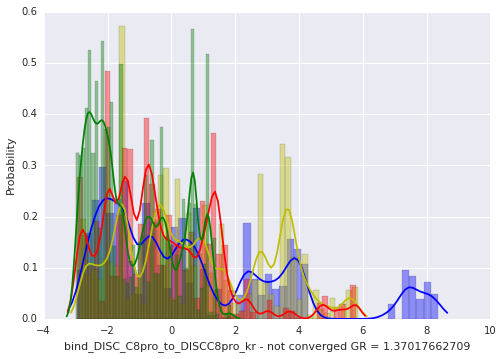

...

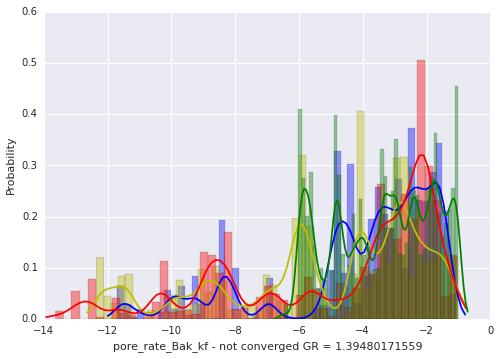

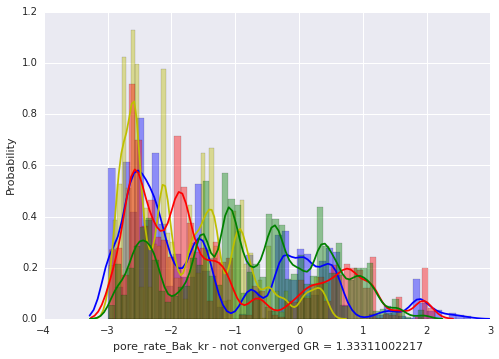

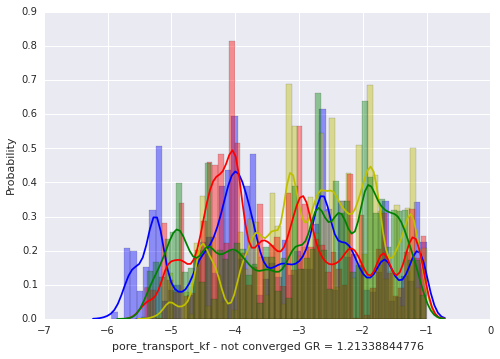

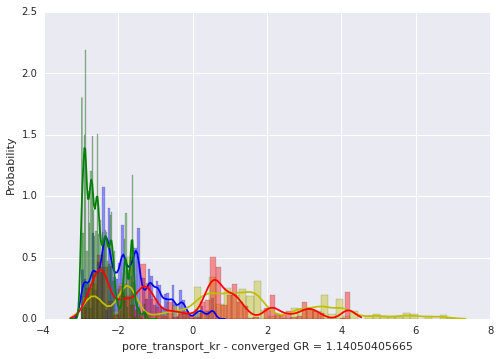

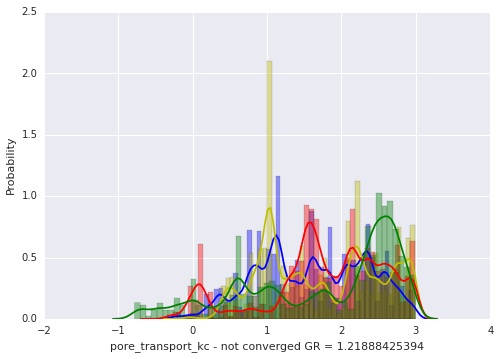

In [14]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [15]:
traces['a'][1][:,0]

array([-6.26999165, -6.26076699, -6.26076699, ..., -8.60173965,
       -8.60173965, -8.60173965])

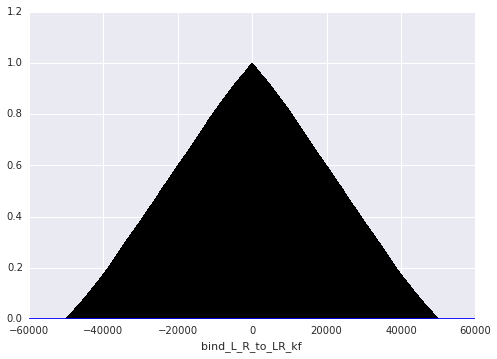

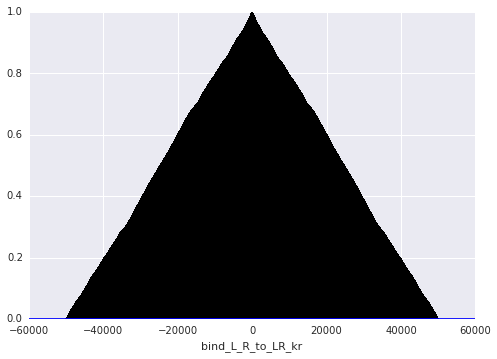

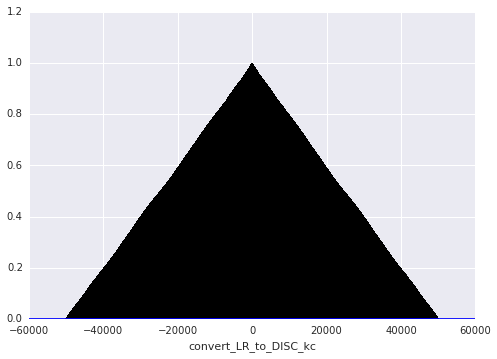

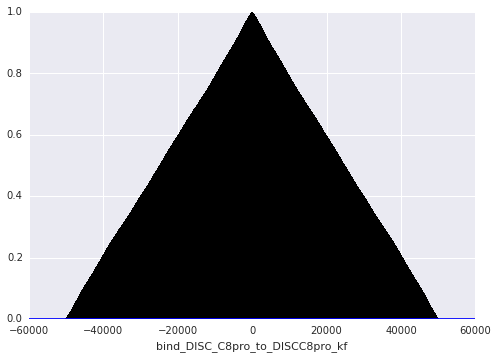

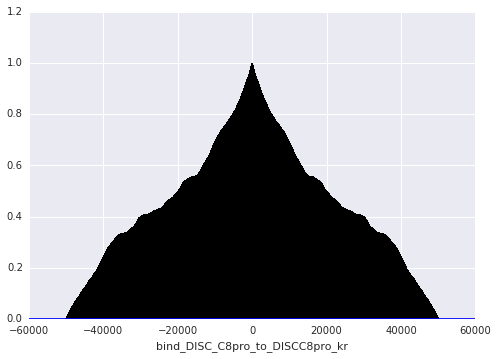

...

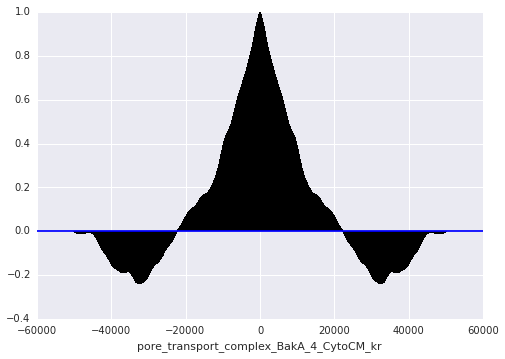

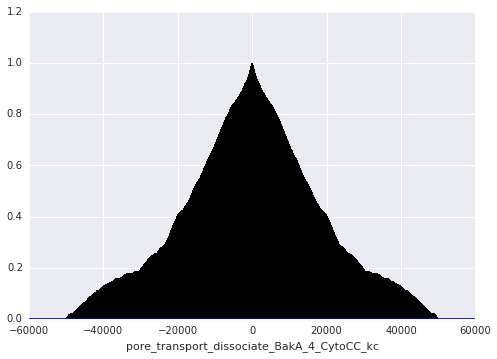

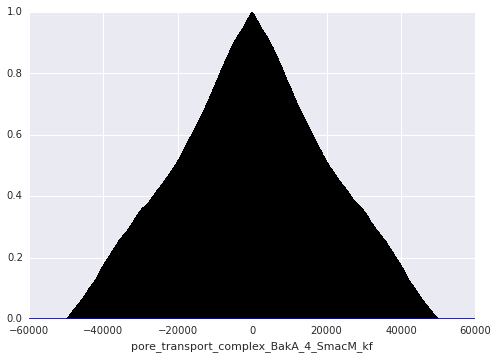

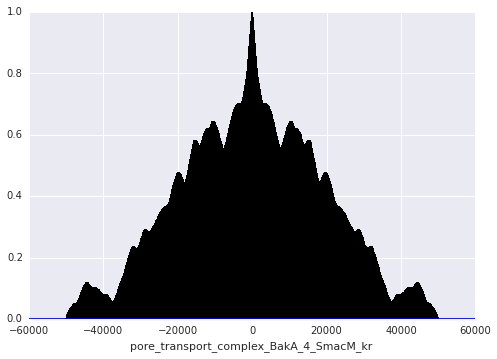

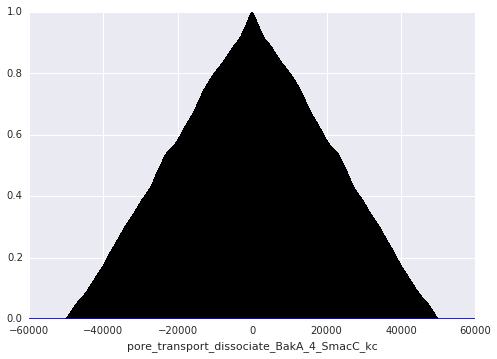

In [21]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

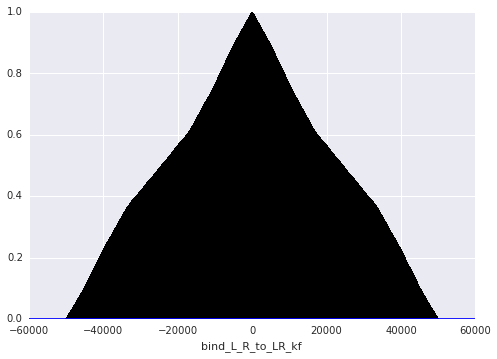

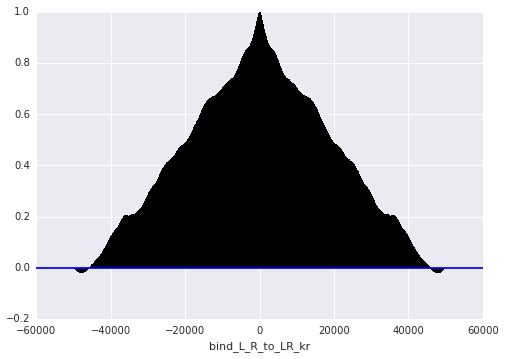

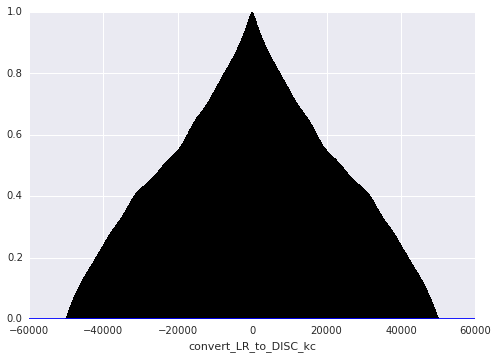

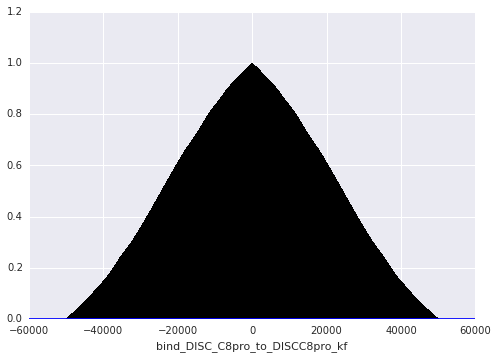

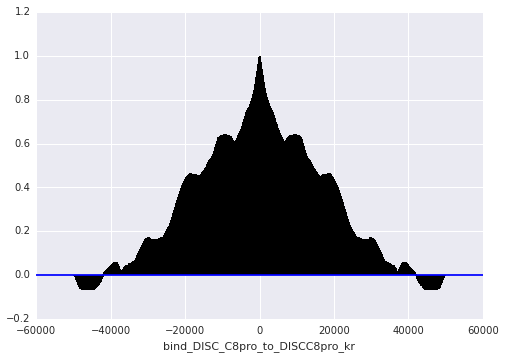

...

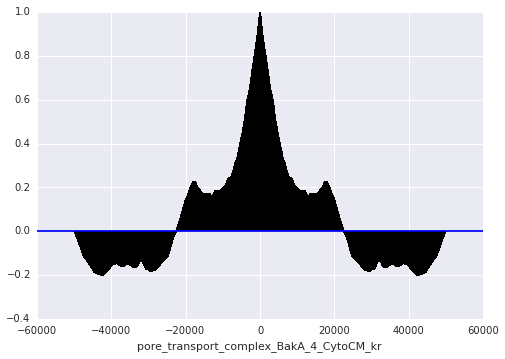

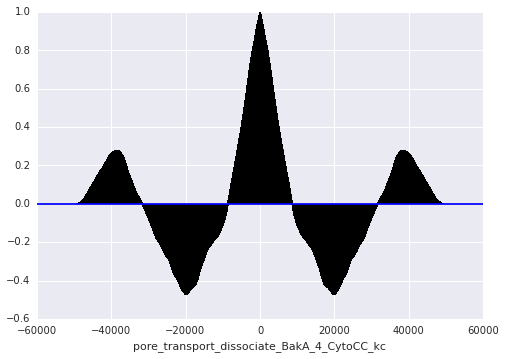

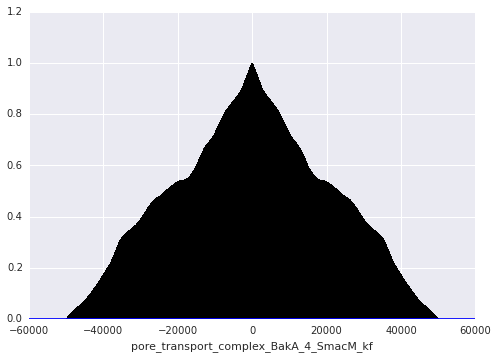

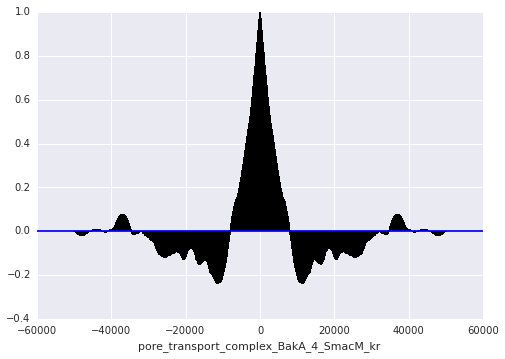

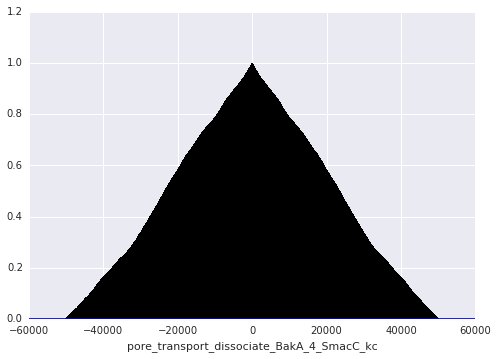

In [22]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

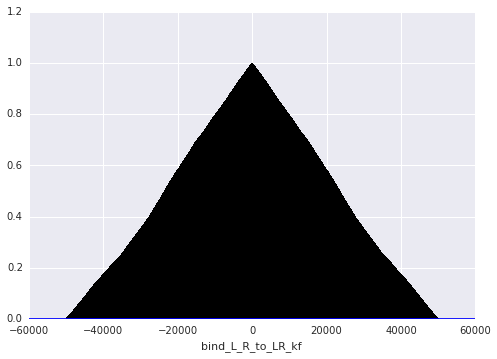

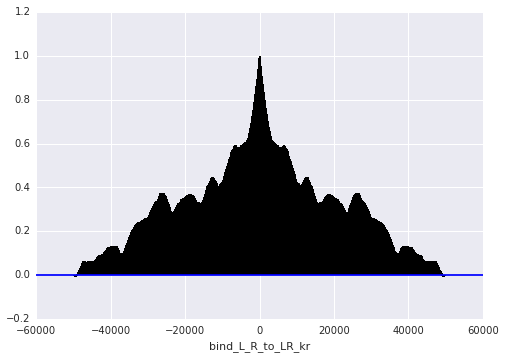

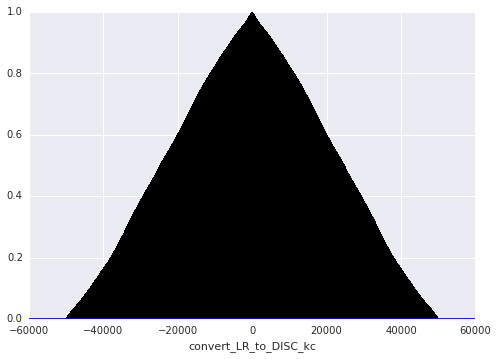

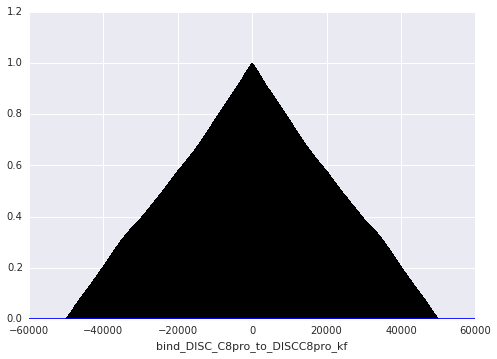

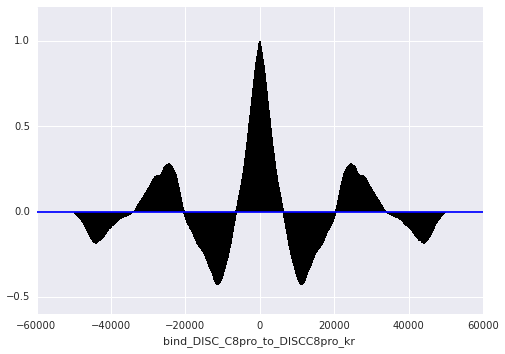

...

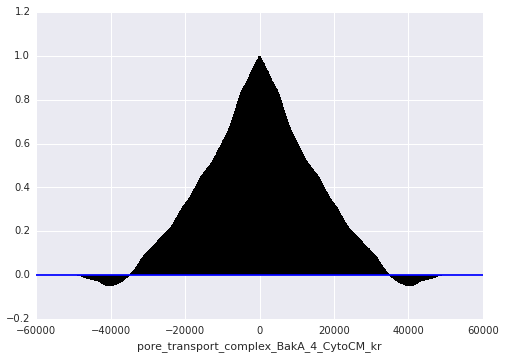

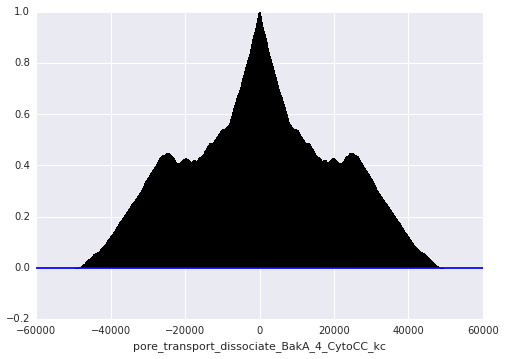

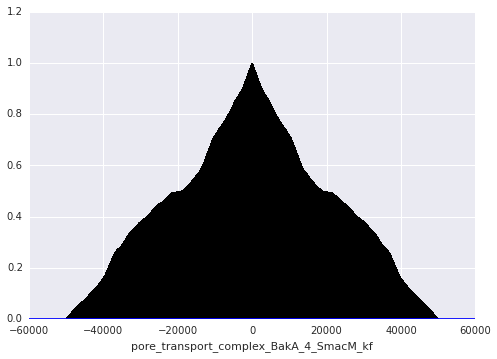

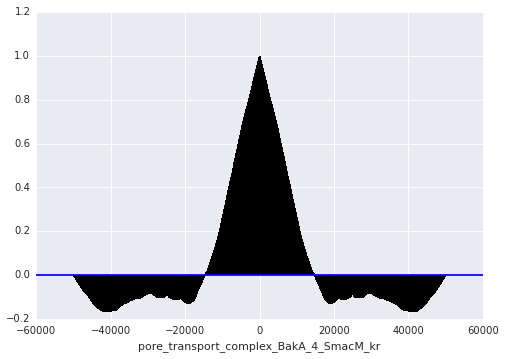

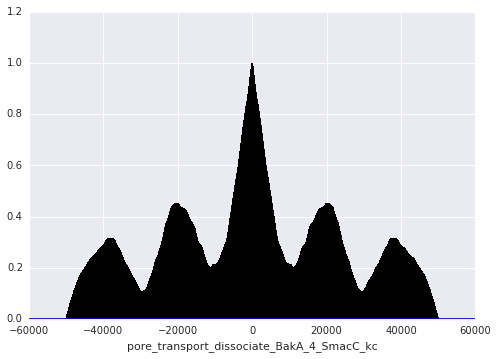

In [23]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [16]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  489  acceptance rate:  0.00978
N acceptances for parameter:  bind_L_R_to_LR_kr  =  513  acceptance rate:  0.01026
N acceptances for parameter:  convert_LR_to_DISC_kc  =  450  acceptance rate:  0.009
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  476  acceptance rate:  0.00952
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  490  acceptance rate:  0.0098
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  507  acceptance rate:  0.01014
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  482  acceptance rate:  0.00964
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  513  acceptance rate:  0.01026
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  498  acceptance rate:  0.00996
N acceptances for parameter:  bind_DISC_flip_kf  =  484  acceptance rate:  0.00968
N acceptances for parameter:  bind_DISC_flip_kr  =  489  acceptance rate:  0.00978
N accept

array([ 0.00978,  0.01026,  0.009  ,  0.00952,  0.0098 ,  0.01014,
        0.00964,  0.01026,  0.00996,  0.00968,  0.00978,  0.01   ,
        0.00998,  0.01044,  0.00962,  0.0102 ,  0.0102 ,  0.01038,
        0.01006,  0.00994,  0.00984,  0.0102 ,  0.00972,  0.0104 ,
        0.00964,  0.00982,  0.00986,  0.00978,  0.01012,  0.00944,
        0.00984,  0.00994,  0.01002,  0.0102 ,  0.01026,  0.00898,
        0.00958,  0.0102 ,  0.00938,  0.01008,  0.0096 ,  0.0096 ,
        0.00988,  0.01   ,  0.00962,  0.00972,  0.01006,  0.00972,
        0.01022,  0.01024,  0.00984,  0.01024,  0.00984,  0.01   ,
        0.00994,  0.01018,  0.01006,  0.00968,  0.00968,  0.0102 ,
        0.0099 ,  0.01042,  0.0103 ,  0.00998,  0.0099 ,  0.01012,
        0.01028,  0.00998,  0.00984,  0.01004,  0.00976,  0.01014,
        0.01028,  0.0098 ,  0.00978,  0.0102 ,  0.0103 ,  0.00984,
        0.01   ,  0.00994,  0.0099 ,  0.01052,  0.01014,  0.0097 ,
        0.0103 ,  0.01014,  0.00992,  0.0098 ])

In [17]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  446  acceptance rate:  0.00892
N acceptances for parameter:  bind_L_R_to_LR_kr  =  494  acceptance rate:  0.00988
N acceptances for parameter:  convert_LR_to_DISC_kc  =  458  acceptance rate:  0.00916
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  452  acceptance rate:  0.00904
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  485  acceptance rate:  0.0097
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  485  acceptance rate:  0.0097
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  479  acceptance rate:  0.00958
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  481  acceptance rate:  0.00962
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  490  acceptance rate:  0.0098
N acceptances for parameter:  bind_DISC_flip_kf  =  468  acceptance rate:  0.00936
N acceptances for parameter:  bind_DISC_flip_kr  =  487  acceptance rate:  0.00974
N accept

array([ 0.00892,  0.00988,  0.00916,  0.00904,  0.0097 ,  0.0097 ,
        0.00958,  0.00962,  0.0098 ,  0.00936,  0.00974,  0.00932,
        0.0101 ,  0.0099 ,  0.00952,  0.00972,  0.00984,  0.00958,
        0.00954,  0.01   ,  0.00968,  0.00982,  0.00966,  0.0095 ,
        0.00966,  0.0099 ,  0.00964,  0.00972,  0.00976,  0.00932,
        0.00966,  0.0099 ,  0.0097 ,  0.00966,  0.0096 ,  0.00928,
        0.00996,  0.0095 ,  0.00932,  0.01006,  0.00988,  0.01008,
        0.00978,  0.00994,  0.00924,  0.00956,  0.00996,  0.00992,
        0.01016,  0.00948,  0.00974,  0.00964,  0.0095 ,  0.0098 ,
        0.00986,  0.00958,  0.00996,  0.00968,  0.0093 ,  0.01006,
        0.00972,  0.00968,  0.0099 ,  0.00978,  0.0097 ,  0.00998,
        0.0098 ,  0.00972,  0.0099 ,  0.0096 ,  0.0095 ,  0.0094 ,
        0.01002,  0.0099 ,  0.00958,  0.01016,  0.00972,  0.00974,
        0.0102 ,  0.0099 ,  0.00994,  0.0096 ,  0.00986,  0.00948,
        0.00974,  0.00972,  0.00966,  0.00966])

In [18]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  518  acceptance rate:  0.01036
N acceptances for parameter:  bind_L_R_to_LR_kr  =  559  acceptance rate:  0.01118
N acceptances for parameter:  convert_LR_to_DISC_kc  =  532  acceptance rate:  0.01064
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  526  acceptance rate:  0.01052
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  563  acceptance rate:  0.01126
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  562  acceptance rate:  0.01124
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  556  acceptance rate:  0.01112
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  559  acceptance rate:  0.01118
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  535  acceptance rate:  0.0107
N acceptances for parameter:  bind_DISC_flip_kf  =  562  acceptance rate:  0.01124
N acceptances for parameter:  bind_DISC_flip_kr  =  562  acceptance rate:  0.01124
N acce

array([ 0.01036,  0.01118,  0.01064,  0.01052,  0.01126,  0.01124,
        0.01112,  0.01118,  0.0107 ,  0.01124,  0.01124,  0.01086,
        0.0112 ,  0.0115 ,  0.01084,  0.01108,  0.0114 ,  0.01146,
        0.01098,  0.01142,  0.01116,  0.0115 ,  0.01088,  0.01088,
        0.0108 ,  0.01114,  0.0112 ,  0.01102,  0.01118,  0.01066,
        0.01092,  0.01112,  0.0103 ,  0.0111 ,  0.01088,  0.01102,
        0.0116 ,  0.01094,  0.01088,  0.01106,  0.01096,  0.01116,
        0.01162,  0.01106,  0.01086,  0.01112,  0.01112,  0.0117 ,
        0.01114,  0.01102,  0.01142,  0.01106,  0.01076,  0.01092,
        0.01126,  0.0108 ,  0.0109 ,  0.01142,  0.01128,  0.01104,
        0.0109 ,  0.01122,  0.01116,  0.01126,  0.0114 ,  0.01076,
        0.01098,  0.01124,  0.01112,  0.01124,  0.0113 ,  0.01086,
        0.0112 ,  0.0112 ,  0.01116,  0.01134,  0.01132,  0.01106,
        0.011  ,  0.01102,  0.01138,  0.01122,  0.01144,  0.01118,
        0.01114,  0.01176,  0.01104,  0.0112 ])

In [19]:
acceptance_rates = np.zeros((len(traces['b'][0][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  518  acceptance rate:  0.01036
N acceptances for parameter:  bind_L_R_to_LR_kr  =  559  acceptance rate:  0.01118
N acceptances for parameter:  convert_LR_to_DISC_kc  =  532  acceptance rate:  0.01064
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  526  acceptance rate:  0.01052
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  563  acceptance rate:  0.01126
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  562  acceptance rate:  0.01124
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  556  acceptance rate:  0.01112
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  559  acceptance rate:  0.01118
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  535  acceptance rate:  0.0107
N acceptances for parameter:  bind_DISC_flip_kf  =  562  acceptance rate:  0.01124
N acceptances for parameter:  bind_DISC_flip_kr  =  562  acceptance rate:  0.01124
N acce

array([ 0.01036,  0.01118,  0.01064,  0.01052,  0.01126,  0.01124,
        0.01112,  0.01118,  0.0107 ,  0.01124,  0.01124,  0.01086,
        0.0112 ,  0.0115 ,  0.01084,  0.01108,  0.0114 ,  0.01146,
        0.01098,  0.01142,  0.01116,  0.0115 ,  0.01088,  0.01088,
        0.0108 ,  0.01114,  0.0112 ,  0.01102,  0.01118,  0.01066,
        0.01092,  0.01112,  0.0103 ,  0.0111 ,  0.01088,  0.01102,
        0.0116 ,  0.01094,  0.01088,  0.01106,  0.01096,  0.01116,
        0.01162,  0.01106,  0.01086,  0.01112,  0.01112,  0.0117 ,
        0.01114,  0.01102,  0.01142,  0.01106,  0.01076,  0.01092,
        0.01126,  0.0108 ,  0.0109 ,  0.01142,  0.01128,  0.01104,
        0.0109 ,  0.01122,  0.01116,  0.01126,  0.0114 ,  0.01076,
        0.01098,  0.01124,  0.01112,  0.01124,  0.0113 ,  0.01086,
        0.0112 ,  0.0112 ,  0.01116,  0.01134,  0.01132,  0.01106,
        0.011  ,  0.01102,  0.01138,  0.01122,  0.01144,  0.01118,
        0.01114,  0.01176,  0.01104,  0.0112 ])